# From ALL HUMAN SAMPLES.ipynb


## SVC using high-confidence cells as training dataset
We apply the archetype gene signatures to the data and then take the specialist cells of each phenotype as the training set for the SVM. Then the SVM uses gene expression profiles including HVGs to classify remaining cells. We use the predict_proba function to generate probabilities of belonging to each class, and find cells that are specialists (p > .3 for one class) versus generalists (p > .3 for 2+ classes).

In [223]:
import pickle
from sklearn import svm 
def svc_recipe(adata, subsample = True, random_state = 0, fraction = 0.1, genes_to_use = None, kernel = 'knn', filename = 'finalized_model.sav', fit_to = -1):
    '''
    genes_to_use: can be "all","hvg", or a list
    '''
    if subsample:
        adata_sub = sc.pp.subsample(adata, fraction=fraction, copy = True, random_state=random_state)
    else: adata_sub = adata.copy()
    X = pd.DataFrame(adata_sub.X.todense(), index=adata_sub.obs_names, columns = adata_sub.var_names)

    #Depending on which features are being used for label propagation, subset the data 
    if type(genes_to_use) not in [list,str]: 
        print("Warning: Genes_to_use must be str (all, hvg) or list")
        pass
    if type(genes_to_use) == type(list):
        print("Using provided set of genes for model...")
        X = X[genes_to_use]
    else:
        if genes_to_use == 'all': 
            print("Using all genes for model...")

        elif genes_to_use == 'hvg':
            print("Using highly variable genes for model...")
            if 'highly_variable' not in adata_sub.var.columns:
                sc.pp.highly_variable_genes(adata_sub, inplace=True)
            X = X.T[adata_sub.var['highly_variable']].T
            print(X.shape)
    y = np.array(adata_sub.obs['Phenotype'])
    
    #remove Generalist, None, and nan labels and use -1 for classifier
#     unlabeled = adata_sub.obs['Phenotype'] == 'Generalist'
#     y[unlabeled] = -1
#     y[[type(i) == type(np.nan) for i in y]] = -1
#     y[[i == 'None' for i in y]] = -1
    if fit_to == -1:
        #separate X_train and X_test
        train_ind = []
        test_ind = []
        for i,r in (adata_sub.obs).iterrows():
            if r['Phenotype'] in ['Generalist','None',np.nan]: #testing set is generalists, none, and nans
                test_ind.append(i)
            else:
                train_ind.append(i) #training on specialists
        X_train = X.loc[train_ind]
        X_test = X.loc[test_ind]

        training = [i in train_ind for i in adata_sub.obs['Phenotype'].index]
        testing = [i in test_ind for i in adata_sub.obs['Phenotype'].index]
        y_train = y[training]
        y_test = y[testing]
    else:
        #take top fit_to cells for each phenotype
        subtype_score_df = adata_sub.obs[[f'SCLC-{x}_Score_pos' for x in ['A','A2','N','P','Y']]]
        train_ind = []
        test_ind = []
        y_train = []
        for s in ['SCLC-A','SCLC-A2','SCLC-N','SCLC-P','SCLC-Y']:
            tmp = subtype_score_df.sort_values(f"{s}_Score_pos", ascending = False)
            for c in tmp.iloc[0:fit_to].index:
                train_ind.append(c)
                y_train.append(s)
        X_train = X.loc[train_id]
        X_test = X.loc[list(set(X.index).difference(set(train_ind)))]
        
    adata_sub.obs['training_set'] = [q in train_ind for q in adata_sub.obs_names]   
    map_dict = {}
    for x, i in enumerate(set(y).difference(set({-1}))):
            map_dict[i] = x
    
    print(f"Fitting model on {len(X_train.index)} cells...")
    #fit SVM Classifier model to data
    svc = svm.SVC(probability=True)
    svc.fit(X_train, y_train)
    
    # save the model 
    print(f'Saving model as {filename}...')
    print(f"To reload model in the future, use `loaded_model = pickle.load(open({filename}, 'rb'))`")
    pickle.dump(svc, open(filename, 'wb'))

    inv_dict = {}
    for k in map_dict.keys():
        inv_dict[map_dict[k]] = k
   
  
    #add attributes to adata_sub
    print("Adding attributes to adata...")
    print("Phenotype_svc")

    print("svm_proba_x for x in: ", svc.classes_)

    svm_proba = pd.DataFrame(svc.predict_proba(X), columns = svc.classes_, index = X.index)
    adata_sub.obs['Phenotype_svc'] = svm_proba.idxmax(axis = 1)
    for c in svm_proba.columns:
        adata_sub.obs[f'svm_proba_{c}'] = svm_proba[c]
    return adata_sub, svm_proba, train_id

In [224]:
adata,svm_proba,train_id = svc_recipe(adata, subsample=False,genes_to_use='hvg', filename='./out/svc_hvg_model')

Using highly variable genes for model...
(17759, 1351)
Fitting model on 5836 cells...
Saving model as ./out/svc_hvg_model...
To reload model in the future, use `loaded_model = pickle.load(open(./out/svc_hvg_model, 'rb'))`
Adding attributes to adata...
Phenotype_svc
svm_proba_x for x in:  ['SCLC-A' 'SCLC-A2' 'SCLC-N' 'SCLC-P' 'SCLC-Y']


In [220]:
loaded_model = pickle.load(open("./out/svc_hvg_model", 'rb'))

## Back to SVM

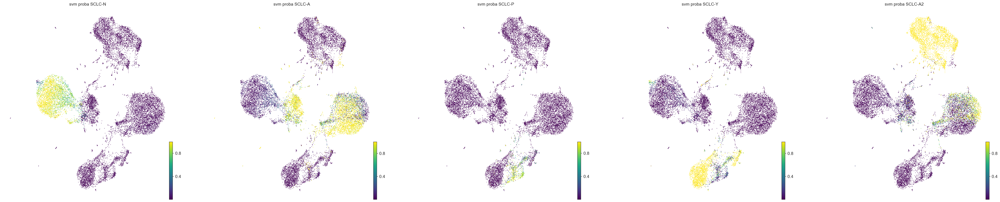

In [226]:
scv.pl.scatter(adata, basis = 'umap_sc', color = [f"svm_proba_{x}" for x in ['SCLC-N', 'SCLC-A', 'SCLC-P', 'SCLC-Y', 'SCLC-A2']], figsize = (10,10), cmap = 'viridis')


In [227]:
adata.obs['svm_proba_SCLC-NE'] = adata.obs['svm_proba_SCLC-A']+adata.obs['svm_proba_SCLC-A2']+adata.obs['svm_proba_SCLC-N']


Phenotype_svc plotted here is the max phenotype probability, and we can compare to the graphs showing archetype scores.

In [228]:
adata.obs['SCLC-NE_Score_pos'] = adata.obs['SCLC-NE_Score_pos']+adata.obs['SCLC-A2_Score_pos']+adata.obs['SCLC-N_Score_pos']


In [229]:
color_map = {}
for b, c in zip(sorted(list(set(adata.obs.batch))),px.colors.qualitative.D3):
    color_map[b] = c

In [193]:
# import plotly.express as px
# fig = px.scatter_ternary(adata.obs, a="SCLC-NE_Score_pos", b="SCLC-P_Score_pos", c="SCLC-Y_Score_pos", color = 'batch', color_discrete_map=color_map)
# fig.show()
# fig = px.scatter_ternary(adata.obs.loc[adata.obs['SCLC-NE_Score_pos']>.8], b="SCLC-A2_Score_pos", c="SCLC-N_Score_pos", color = 'batch', color_discrete_map=color_map)
# fig.show()

In [69]:
# import plotly.express as px
# fig = px.scatter_ternary(adata.obs, a="svm_proba_SCLC-NE", b="svm_proba_SCLC-P", c="svm_proba_SCLC-Y", color = 'batch',color_discrete_map=color_map)
# fig.show()
# fig = px.scatter_ternary(adata.obs.loc[adata.obs['svm_proba_SCLC-NE']>.8], a="svm_proba_SCLC-A", b="svm_proba_SCLC-A2", c="svm_proba_SCLC-N", color = 'batch',
#                          color_discrete_map=color_map
# #                          color_discrete_sequence=px.colors.qualitative.D3)
#                         )

# fig.show()

<BarContainer object of 3 artists>

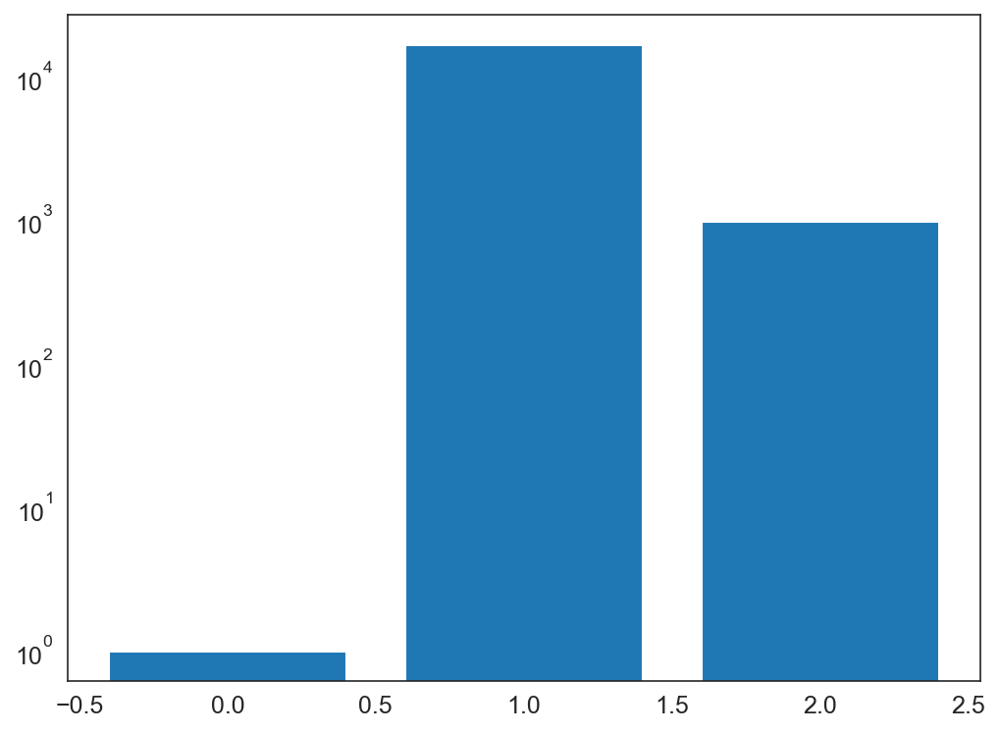

In [230]:
df = adata.obs[[f"svm_proba_{x}" for x in ['SCLC-N', 'SCLC-A', 'SCLC-P', 'SCLC-Y', 'SCLC-A2']]]
plt.bar(height = np.unique((df > .3).sum(axis = 1), return_counts=True)[1], x = range(3), log=True)

There are not any cells that have high probability for more than 2 cell types, so generalists will be cells with p > 0.3 for two cell types. Some have low probability for all cell types, which may be outliers.

In [231]:
svc_pheno = []
svc_aa_type = []
for i,r in df.iterrows():
    
    if (r > .3).sum() > 1:
        svc_aa_type.append('Generalist')
        svc_pheno.append(r.sort_values(ascending=False)[0:2].sort_index().index[0].split('_')[2]+"_"+r.sort_values(ascending=False)[0:2].sort_index().index[1].split('_')[2])
        
    else:
        svc_aa_type.append(r.idxmax().split('_')[2]+" Specialist")
        svc_pheno.append(r.idxmax().split('_')[2])

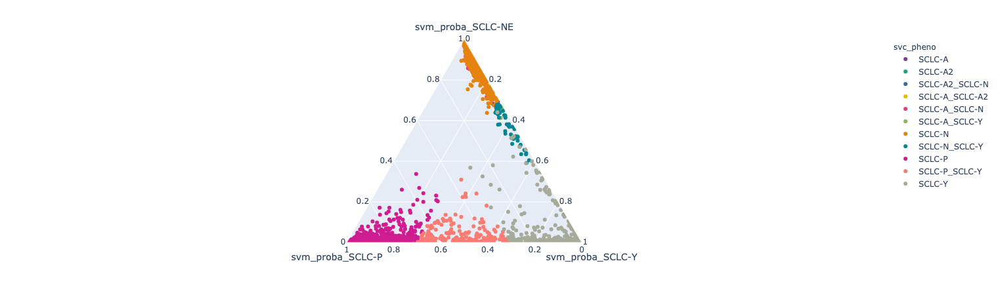

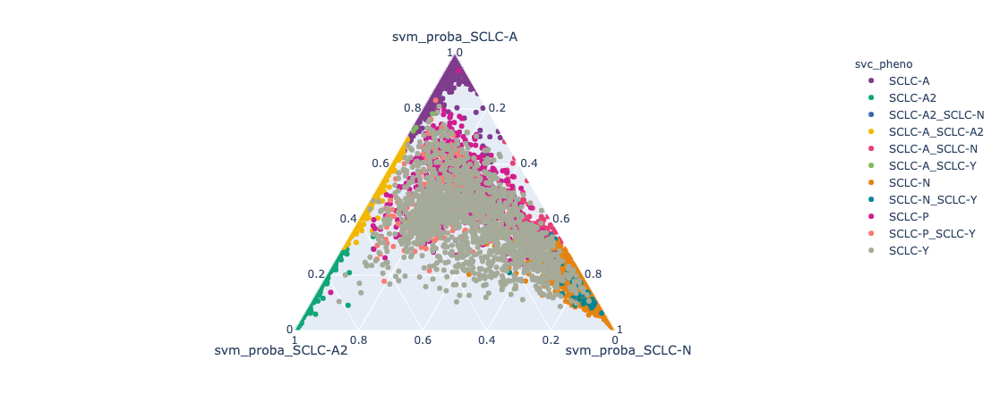

In [232]:
import plotly.express as px
adata.obs['svc_pheno'] = svc_pheno
adata.obs['svc_aa_type'] = svc_aa_type
color_map_pheno = {}
for b, c in zip(sorted(list(set(adata.obs.svc_pheno))),px.colors.qualitative.Bold):
    color_map_pheno[b] = c
fig = px.scatter_ternary(adata.obs.sort_values('svc_pheno'), a="svm_proba_SCLC-NE", b="svm_proba_SCLC-P", c="svm_proba_SCLC-Y", color = 'svc_pheno', 
                         color_discrete_map=color_map_pheno)
# fig.update_traces(legendgroup={'Specialists':['SCLC-A','SCLC-A2','SCLC-N','SCLC-P','SCLC-Y'],
#                               "Generalists":['SCLC-A_SCLC-A2','SCLC-A2_SCLC-N','SCLC-A_SCLC-N','SCLC-A_SCLC-Y','SCLC-N_SCLC-Y','SCLC-P_SCLC-Y' ]}
#                   , selector=dict(type='scatter'))
# fig.update_layout(legend_traceorder='grouped')
fig.show()
fig = px.scatter_ternary(adata.obs.sort_values('svc_pheno'), a="svm_proba_SCLC-A", b="svm_proba_SCLC-A2", c="svm_proba_SCLC-N", color = 'svc_pheno',
                         color_discrete_map=color_map_pheno)
fig.show()

In [199]:
def rgb2hex(rgb):
    (r,g,b) = tuple(map(int,rgb.split('(')[1].split(')')[0].split(",")))
    return "#{:02x}{:02x}{:02x}".format(r,g,b)
hex_palette = [rgb2hex(i) for i in px.colors.qualitative.Bold]

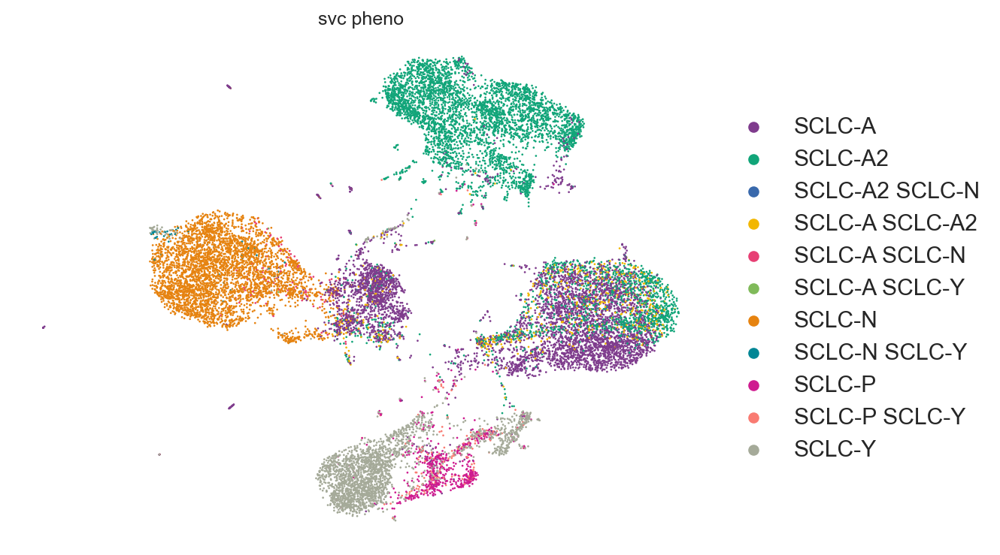

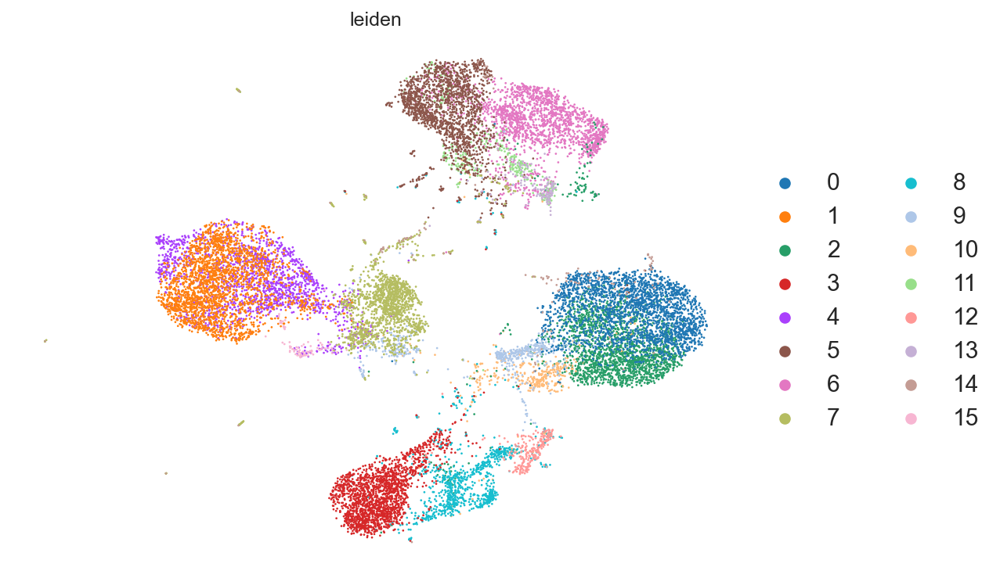

In [200]:
scv.pl.scatter(adata, basis='umap_sc', color = 'svc_pheno', palette = hex_palette, dpi = 150, legend_loc='on right')
scv.pl.scatter(adata, basis='umap_sc', color = 'leiden', dpi = 150, legend_loc='on right')

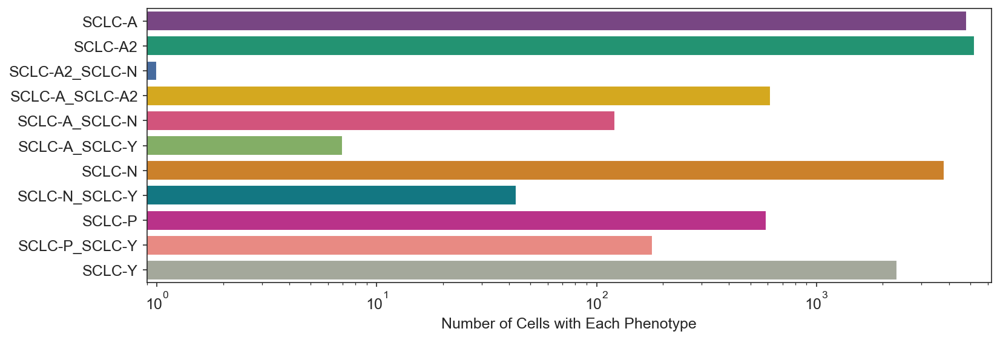

In [219]:
sns.set_style("ticks", {"xtick.major.size": 8, "ytick.major.size": 8})
plt.figure(figsize=(12,4))
p = sns.barplot(y = np.unique(adata.obs['svc_pheno'], return_counts=True)[0], x = (np.unique(adata.obs['svc_pheno'], return_counts=True)[1]), 
            palette=hex_palette
               )
p.set(xscale="log")
plt.xlim(.9, max(np.unique(adata.obs['svc_pheno'], return_counts=True)[1])+1000)
plt.xlabel('Number of Cells with Each Phenotype')
plt.show()

Notably, there are no cells mixed between P and any NE subtypes; A2 and Y; and only 1 cell was mixed between A2 and N.

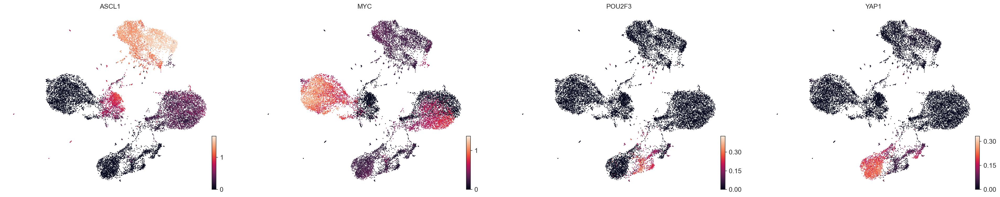

In [23]:
scv.pl.scatter(adata, color = ['ASCL1','MYC','POU2F3','YAP1'], smooth = True, basis = 'umap_sc')

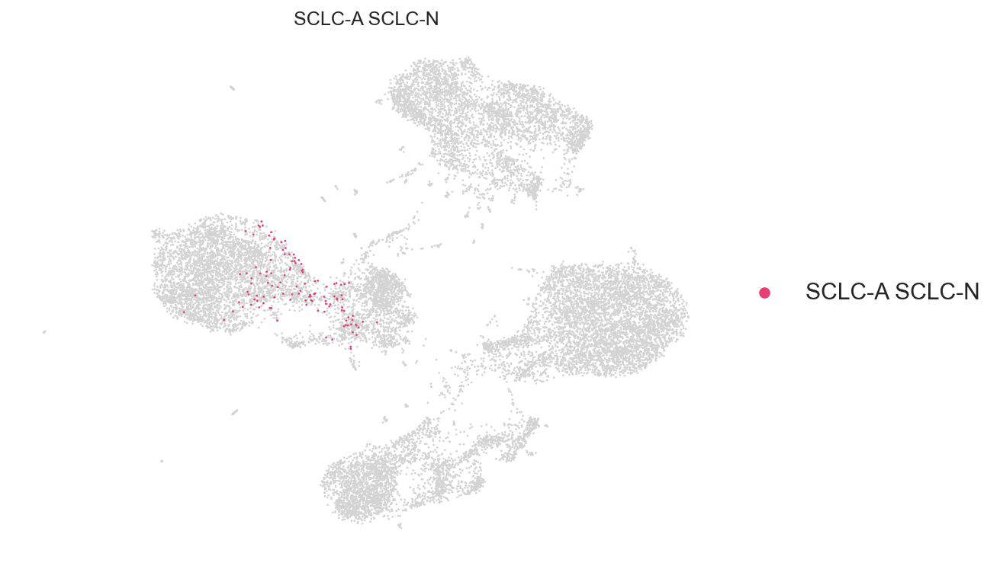

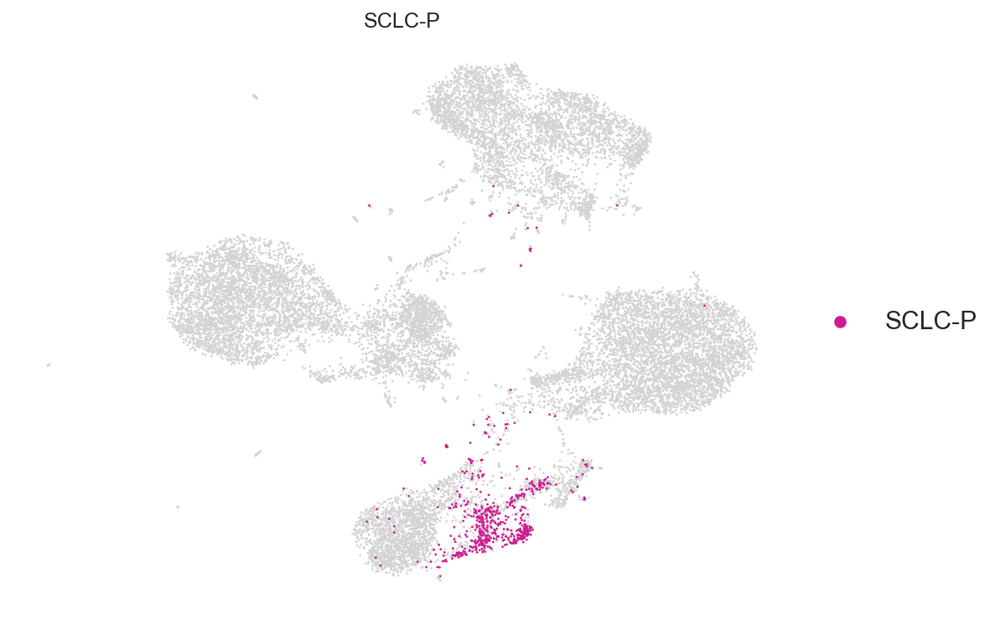

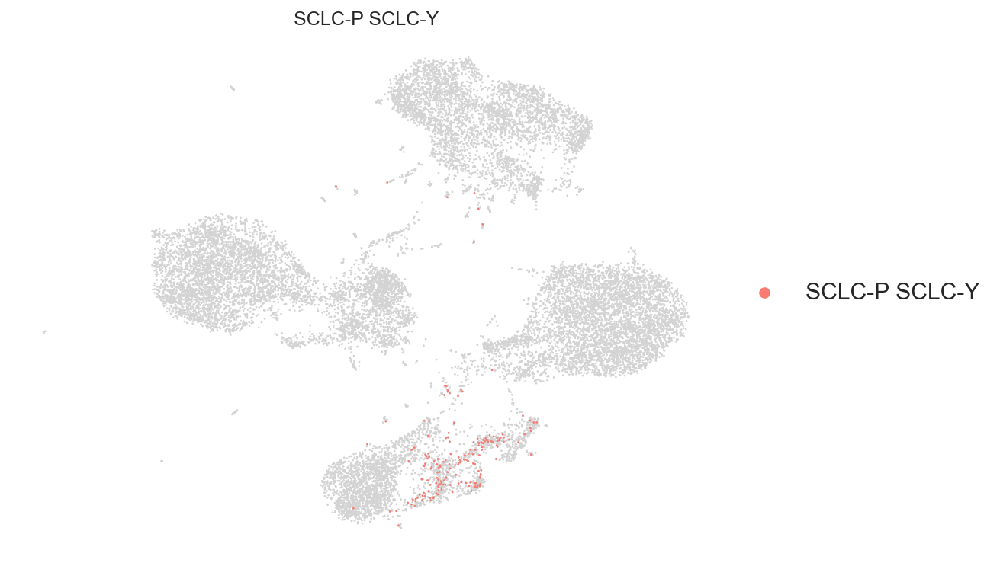

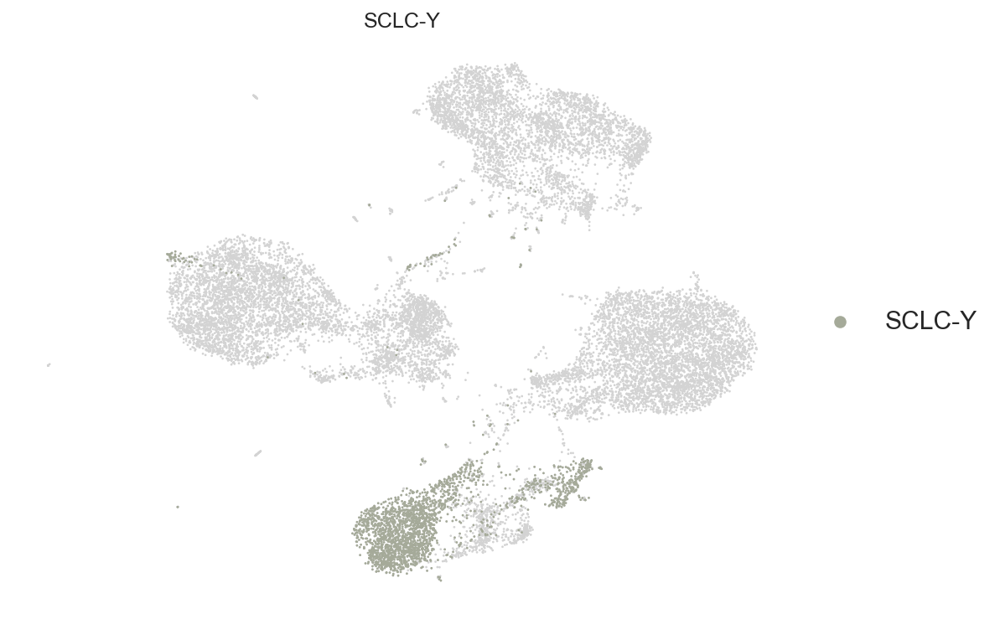

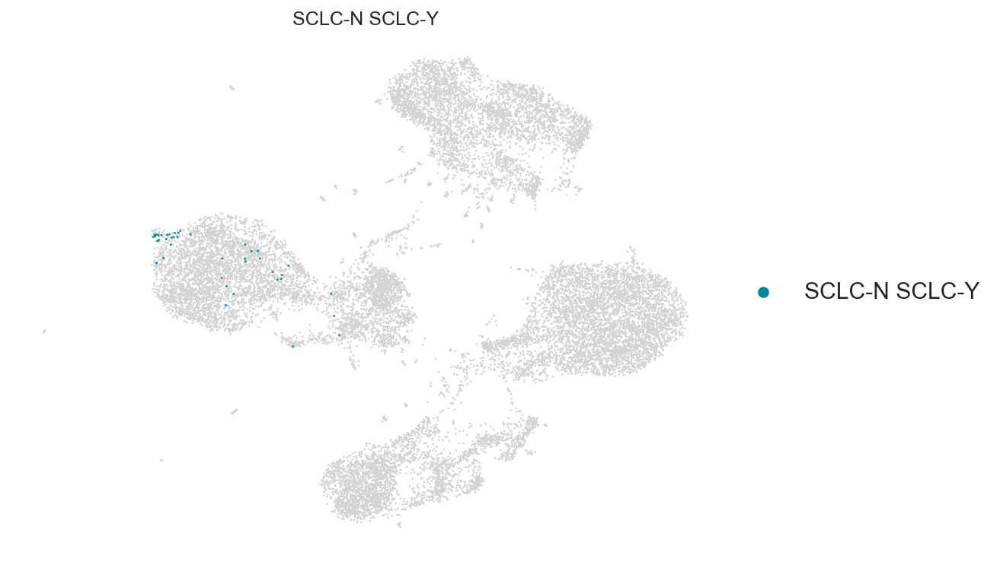

...

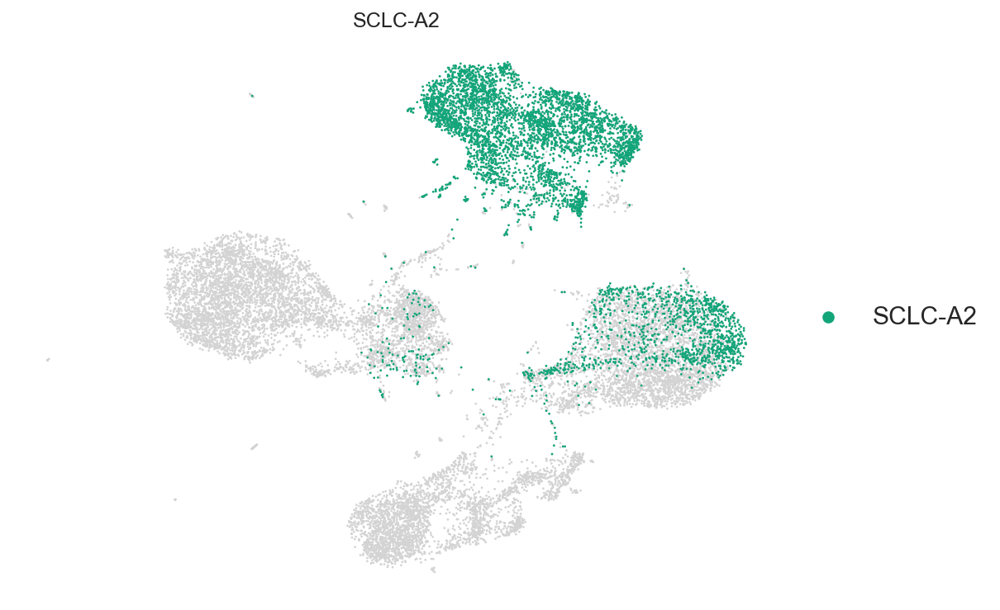

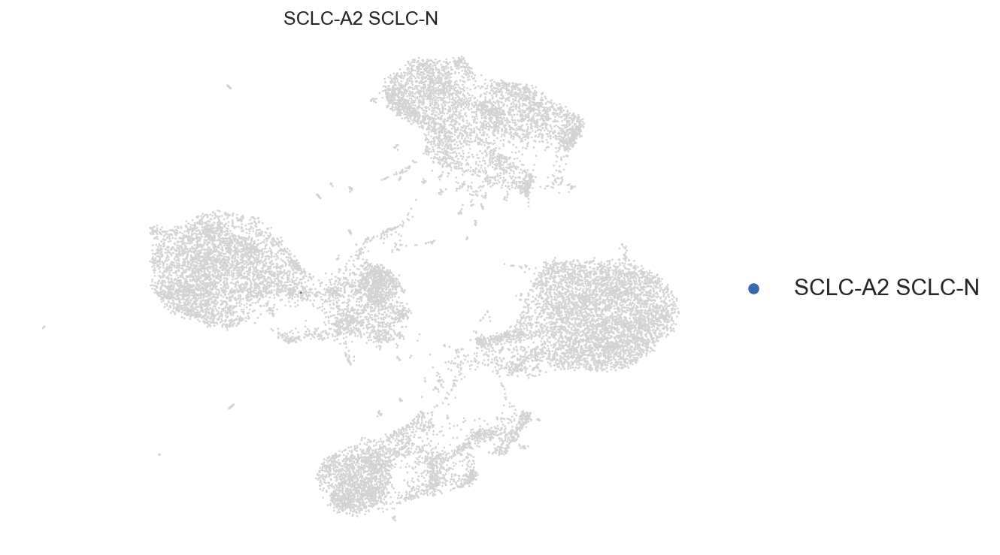

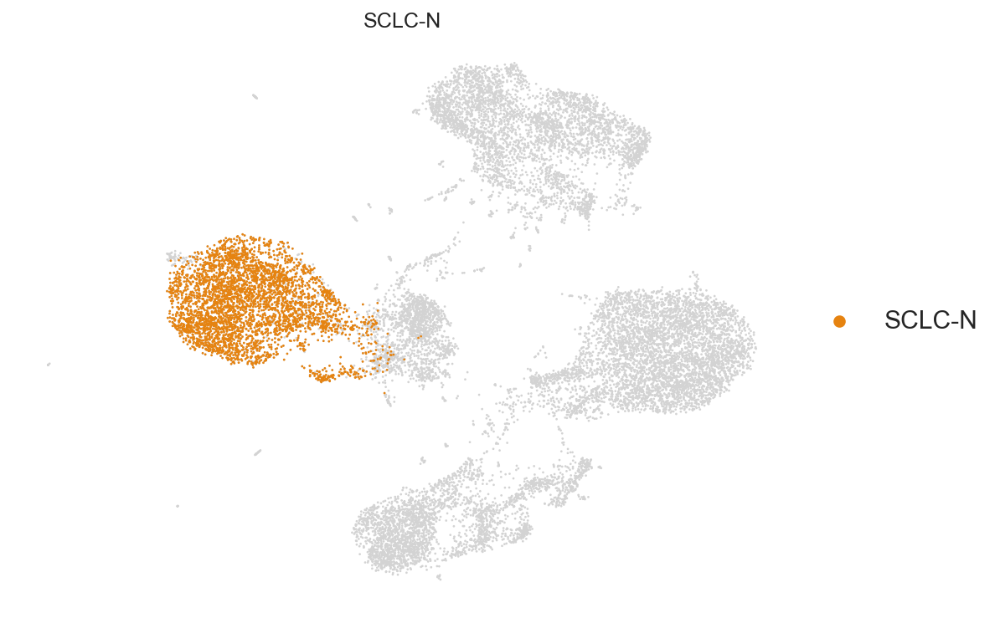

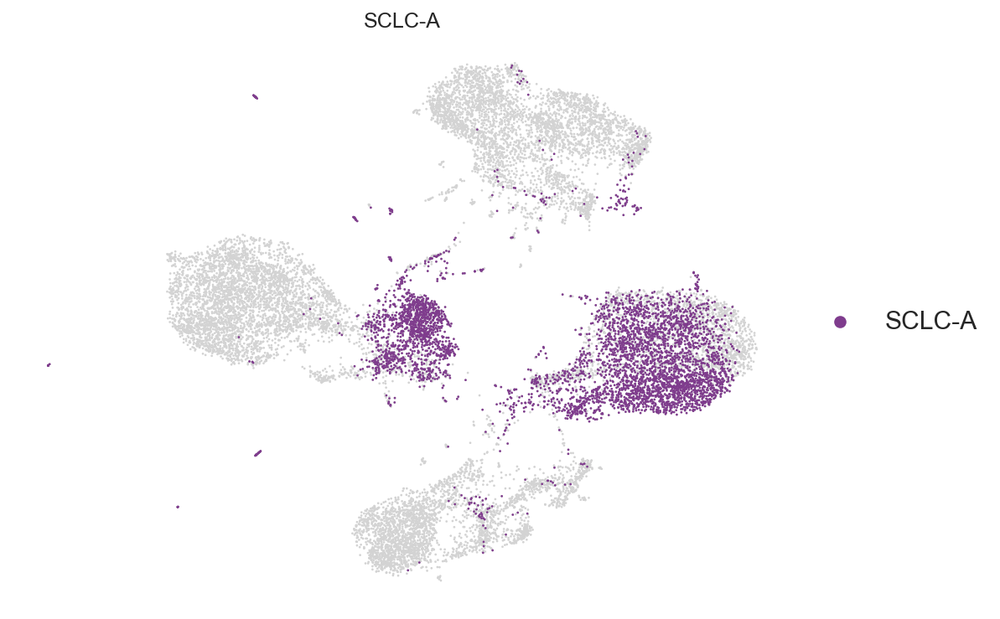

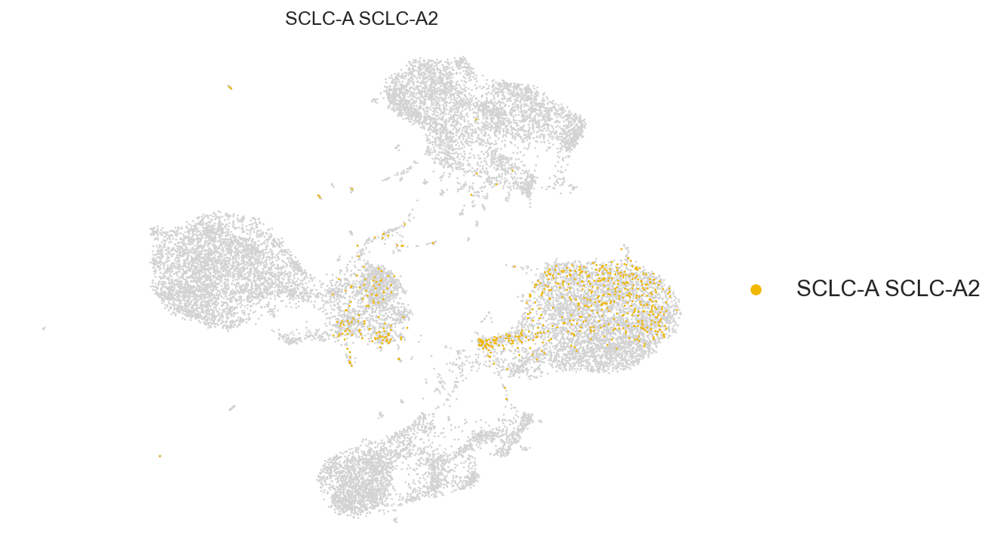

In [28]:
for g in list(set(adata.obs.svc_pheno)):
    scv.pl.scatter(adata, color = 'svc_pheno', basis = 'umap_sc', legend_loc='on right', groups=[g])

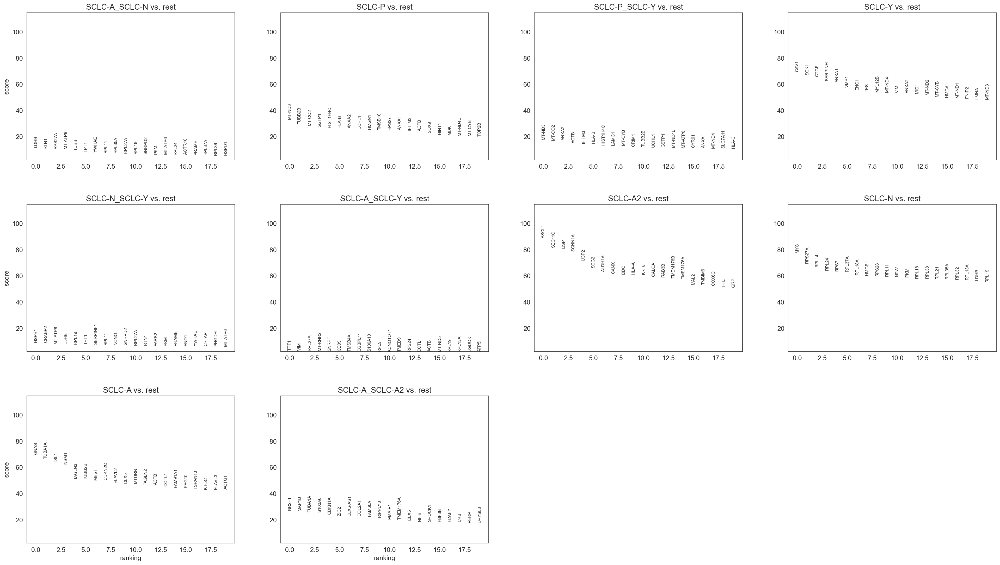

In [10]:
sc.tl.rank_genes_groups(adata, groupby='svc_pheno', groups=list(set(adata.obs['svc_pheno']).difference({'SCLC-A2_SCLC-N'})), method = 'wilcoxon')
sc.pl.rank_genes_groups(adata)

In [60]:
adata.write_h5ad('./data/human_samples_grouped_corrected_.h5ad')

In [11]:
pd.crosstab( adata.obs['svc_pheno'],adata.obs['batch']).style.background_gradient(cmap='viridis')

batch,DMS454,CORL279,H1048,H82,H69,H841,H524,DMS53,tumor1,tumor2
svc_pheno,,,,,,,,,,
SCLC-A,0,2385,0,26,965,0,0,0,1357,97
SCLC-A2,2007,0,0,3,1304,0,0,1849,71,1
SCLC-A2_SCLC-N,0,0,0,1,0,0,0,0,0,0
SCLC-A_SCLC-A2,0,0,0,2,530,0,0,0,86,1
SCLC-A_SCLC-N,0,0,0,110,0,0,11,0,0,0
SCLC-A_SCLC-Y,0,0,0,4,0,0,0,0,3,0
SCLC-N,0,0,0,1467,0,0,2334,0,0,0
SCLC-N_SCLC-Y,0,0,0,43,0,0,0,0,0,0
SCLC-P,0,0,592,0,0,0,0,0,0,0


H82 is an interesting cell line, because it seems to have cells in A, N, and Y.  Let's look a little more in depth.

In [71]:
# fig = px.scatter_ternary(adata.obs.loc[adata.obs['batch']=='H82'], a="svm_proba_SCLC-A", b="svm_proba_SCLC-N", c="svm_proba_SCLC-Y", color = 'svc_pheno',
#                          color_discrete_map=color_map_pheno)
# fig.show()

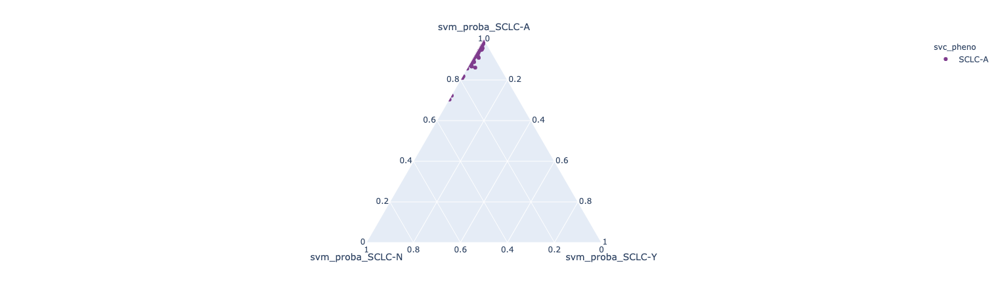

In [87]:
import plotly.express as px

fig = px.scatter_ternary(adata.obs.loc[adata.obs['batch']=='CORL279'], a="svm_proba_SCLC-A", b="svm_proba_SCLC-N", c="svm_proba_SCLC-Y", color = 'svc_pheno',
                         color_discrete_map=color_map_pheno)
fig.show()